In [1]:
import MDAnalysis as mda
import matplotlib.pyplot as plt
import time
import pickle
import sys
import mdtraj as md
import os
import plumed
from MDAnalysis.analysis import rms
import pandas as pd
import pyemma.coordinates as coor
import deeptime
from mlcolvar.core.stats import TICA
import numpy as np
from sklearn.decomposition import PCA
from utils import *
def get_dihedral(traj, dihedral, i):
    dihedral_list = ["phi", "psi", "omega"]
    atom_angles = [["CLP", "NL", "CA", "CLP"], ["NL", "CA", "CLP", "NL"], ["CA", "CLP", "NL", "CA", "CAT"]]
    adjustment = [[-1, 0, 0, 0], [0, 0, 0, 1], [0, 0, 1, 1, 1]]
    k = dihedral_list.index(dihedral)
    at_angles = atom_angles[k]
    res_nums = np.array(adjustment[k]) + i
    search_strings = ["resid " + str(rn) + " and name " + str(ang) for rn, ang in zip(res_nums, at_angles)]
    search_indices = traj.topology.select(" or ".join(search_strings))
    return md.compute_dihedrals(traj, [search_indices])
def clean_file(cv, increment):
    minicvt = cv['time'][:-1].to_numpy()
    minicvp = cv['time'][1:].to_numpy()
    bad_idxs = np.where(minicvt != minicvp - increment)[0]
    i = 0
    while len(bad_idxs) != 0:
        i += len(bad_idxs)
        cv = cv.drop(bad_idxs)
        minicvt = cv['time'][:-1].to_numpy()
        minicvp = cv['time'][1:].to_numpy()
        bad_idxs = np.where(minicvt != minicvp - increment)[0]
    print("Cleaned " + str(i) + " bad indices")
    return cv
def compute_ramachandran_numbers(phis, psis, omegas):
    lam = 2 * np.pi
    sigma = 100000
    lamp = np.round(np.sqrt(2) * lam * sigma)
    phips = np.round((phis - psis) * sigma / np.sqrt(2))
    psips = np.round((phis + psis) * sigma / np.sqrt(2))
    Rzs = phips + lamp * psips
    Rz_min = 0
    Rz_max = Rz_min + lamp ** 2
    ramas = (Rzs - Rz_min) / (Rz_max - Rz_min)
    ramas /= 2
    ramas = np.where(np.abs(omegas) > 2, ramas, ramas + 0.5)
    return ramas

from tqdm import tqdm
%matplotlib inline
#%matplotlib notebook
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [2]:
# pca = PCA()
# dist_transform = pca.fit_transform(np.concatenate(dists))
# print(dist_transform.shape)
# from mlcolvar.cvs import DeepTICA
# from tqdm import tqdm
# tica = TICA(var_cutoff=1, lagtime=20)

# for folder in ['EKGEKG', 'DMGCIG', 'PPGPPG']:
#     if folder.endswith('G') and len(folder) == 6:
#         for i in range(1, 6):
#             try:
#                 traj = md.load(f'{folder}/3_anneal/md{i}_whole.xtc', top=f'{folder}/3_anneal/md_whole.gro')
#                 n_frames = len(np.loadtxt(f'{folder}/3_anneal/{i}_annealing_output.txt'))
                
#                 traj_ca = traj.atom_slice(traj.top.select('name CA'))[:int(n_frames * 1.5)]
                
#                 dists = compute_all_distances(traj_ca)
#                 tica.partial_fit(dists)
#             except:
#                 print(f'{folder} {i} failed')

        


In [3]:
# with open("tica_short.pkl", "wb+") as f:
#     pickle.dump(tica, f)

In [4]:
with open("tica_short.pkl", "rb") as f:
    tica = pickle.load(f)

In [7]:
# plt.plot(np.abs(tica.model.cumulative_kinetic_variance))
tica.model.cumulative_kinetic_variance

array([0.01044808, 0.01991775, 0.0292982 , ..., 1.        , 1.        ,
       1.        ])

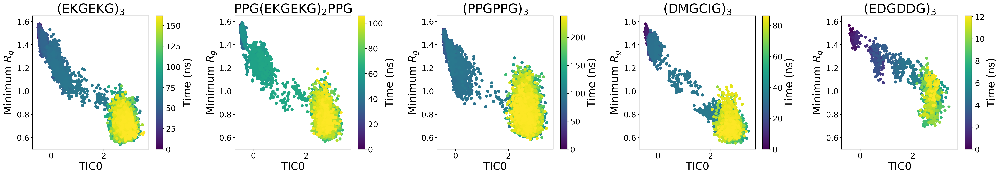

In [25]:

import matplotlib
matplotlib.rcParams['figure.figsize'] = (32,6)
matplotlib.rcParams['font.size'] = 24
matplotlib.rc('xtick', labelsize=18) 
matplotlib.rc('ytick', labelsize=18) 


colors = ['red', 'orange', 'yellow', 'green', 'blue', 'purple']
fig, ax = plt.subplots(1, 5, dpi=200)
for k, folder in enumerate(['EKGEKG', 'HYBRID', 'PPGPPG', 'DMGCIG', 'EDGDDG']):
    ax_ = ax[k]
    traj = md.load(f'{folder}/3_anneal/md0_whole.xtc', top=f'{folder}/3_anneal/md_whole.gro')
    traj_ca = traj.atom_slice(traj.top.select('name CA'))
    helix1 = traj.atom_slice(traj.top.select('name CA and (resid 0 to 19)'))
    helix2 = traj.atom_slice(traj.top.select('name CA and (resid 20 to 39)'))
    helix3 = traj.atom_slice(traj.top.select('name CA and (resid 40 to 59)'))
    min_rg = np.min([md.compute_rg(helix1), md.compute_rg(helix2), md.compute_rg(helix3)], axis=0)
    dists = compute_all_distances(traj_ca)
    dist_tica = tica.transform(dists)
    break_index = np.where(dist_tica[:, 0] > 2)[0][0]
    
    cc = ax_.scatter(dist_tica[:int(break_index * 2.5), 0], min_rg[:int(break_index * 2.5)], c=traj.time[:int(break_index * 2.5)] / 2000)
    ax_.set_xlabel('TIC0')
    ax_.set_ylabel('Minimum $R_g$')
    if folder == 'HYBRID':
        ax_.set_title(f'PPG(EKGEKG)$_2$PPG')
    else:
        ax_.set_title(f'({folder})$_3$')
    ax_.set_ylim(0.5, 1.65)
    ax_.set_xlim(-0.7, 3.7)
    cbar = fig.colorbar(cc, ax=ax_)
    cbar.ax.set_ylabel('Time (ns)')
plt.tight_layout(pad=1)
plt.show()

In [6]:
from tqdm import tqdm
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10,10)

matrix = np.empty((54, 54))
matrix[:] = np.nan
idxs = np.arange(54)
grid = np.array(np.meshgrid(idxs, idxs)).T.reshape(-1, 2)

pairs = grid[grid[:, 0] > grid[:, 1]]
for i in tqdm(range(len(pairs))):
    matrix[pairs[i][0], pairs[i][1]] = tica.model.left_singular_values[i, 0]
plt.imshow(matrix.T, origin='lower', cmap='viridis')
plt.title('TIC0', fontsize=30)
plt.colorbar()



  0%|                                                  | 0/1431 [00:04<?, ?it/s]


AttributeError: 'CovarianceKoopmanModel' object has no attribute 'left_singular_values'

In [17]:
import nglview as nv



def view_frame(folder, val):
    traj = md.load(f'{folder}/3_anneal/md0_whole.xtc', top=f'{folder}/3_anneal/md_whole.gro')
    traj_ca = traj.atom_slice(traj.top.select('name CA'))
    traj_backbone = traj.atom_slice(traj.top.select('name CA or name CLP or name NL or name OL'))
    traj_nb = traj.atom_slice(traj.top.select('not (name CA or name CLP or name OL or element H) and not resname ACEp and not resname NMEp and not resid 1 and not resid 21 and not resid 41 and not resid 19 and not resid 39 and not resid 59'))
    ca_dists = compute_all_distances(traj_ca)
    cvs = tica.transform(ca_dists)[:, 0]
    frame = np.argmin(np.abs(cvs - val))
    view = nv.show_mdtraj(traj_backbone[frame])
    view.clear()
    view.add_ribbon()
    # a = view.add_trajectory(traj_nb[frame])
    # a.clear_representations()
    # a.add_representation('ball+stick')
    # view.add_unitcell()
    return view

view_frame('EKGEKG', 1.005)



NGLWidget()

In [45]:
import torch
import torch.nn as nn
import mlcolvar 
# Assume `tica_model` is your trained Deeptime TICA object
# Extract the transformation parameters
means = torch.from_numpy(tica.model.mean_0).to(torch.float32)
components = torch.from_numpy(tica.model.singular_vectors_left[:, 0].reshape((1,-1))).to(torch.float32)

class TICA_transform(mlcolvar.core.transform.Transform):
    def __init__(self, in_features, out_ffeatures):
        super(TICA_transform, self).__init__(in_features, out_features)
        self.fc1 = nn.Linear(len(means), 1, bias=False)
        self.fc1.weight = torch.nn.Parameter(components)
        
    def forward(self, X):
        x_centered = X.to(torch.float32) - means
        return self.fc1(x_centered)

tica_transform = TICA_transform(len(means), 1)


# torch.save(tica_transform, 'torch_tica.pt')
# print("TICA output (PyTorch):", tica_output)


torch.Size([1, 1431])


In [1]:
from tqdm import tqdm
import shutil
def make_plumed_file(folder):
    top = md.load(f'{folder}/3_anneal/npt.gro')
    idxs = top.top.select('name CA')
    grid = np.array(np.meshgrid(idxs, idxs)).T.reshape(-1, 2)
    pairs = grid[grid[:, 0] > grid[:, 1]]
    print(0)
    traj = md.load(f'{folder}/3_anneal/md0_whole.xtc', top=f'{folder}/3_anneal/md_whole.gro')
    print(1)
    traj_water = md.load(f'{folder}/3_anneal/md0.xtc', top=f'{folder}/3_anneal/npt.gro')
    traj_ca = traj.atom_slice(traj.top.select('name CA'))
    ca_dists = compute_all_distances(traj_ca)
    print(2)
    cvs = tica.transform(ca_dists)[:, 0]
    for tic_i in tqdm(np.arange(-1.0, 3.6, 0.1)):
        stri = "".join(str(np.round(tic_i, 1)).split('.')).replace('-', 'n').replace('n00', '00')
        if not os.path.isdir(f'{folder}/4_umbrella/{stri}'):
            os.mkdir(f'{folder}/4_umbrella/{stri}')
        shutil.copyfile('torch_tica.pt', f'{folder}/4_umbrella/{stri}/torch_tica.pt')
        frame = np.argmin(np.abs(cvs - tic_i))
        traj_water[frame].save_gro(f'{folder}/4_umbrella/{stri}/npt.gro')
        distance_string = ','.join([f'd{i+1}' for i in range(len(pairs))])
        with open(f'{folder}/4_umbrella/{stri}/plumed.dat', 'w') as f:
            for i, pair in enumerate(pairs):
                f.write(f'd{i+1}: DISTANCE ATOMS={pair[0]+1},{pair[1]+1}\n')
            f.write(f'tic: PYTORCH_MODEL FILE=torch_tica.pt ARG={distance_string}\n')
            f.write(f'u: RESTRAINT ARG=tic.node-0 KAPPA=1000.0 AT={tic_i}\n') 
            f.write(f'PRINT ARG=tic.node-0,u.bias FILE=COLVAR_{stri} STRIDE=500\n')

In [11]:
# make_plumed_file('EKGEKG')
# make_plumed_file('PPGPPG')
# make_plumed_file('DMGCIG')
# make_plumed_file('EDGDDG')
make_plumed_file('EKGDKG')
make_plumed_file('EKGEXG')
make_plumed_file('EKGKEG')
make_plumed_file('EXGEKG')

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 46/46 [00:09<00:00,  4.71it/s]


In [ ]:
make_plumed_file('HYBRI2')
make_plumed_file('HYBRI3')
make_plumed_file('HYBRI4')
make_plumed_file('HYBRI5')

In [2]:
def get_peptoids_up_to(round=24):
    return np.concatenate([get_peptoids_from_round(r) for r in range(round+1)])
def get_peptoids_from_round(i):
    """
    This function reads the "bo_peptoids.csv" file, and extracts the peptoids for the specified round.

    Args:
        i (int): The round number.

    Returns:
        list: A list of peptoids for the specified round.
    """
    all_peps = pd.read_csv('../bo_peptoids.csv', index_col=0)
    round = all_peps.iloc[i].values.flatten().tolist()
    round = [s for s in round if isinstance(s, str)]
    round = [s for s in round if s[-1] == 'G']
    return round


In [7]:
import torch
tt = torch.load('torch_tica.pt')


In [17]:
tica.model.timescales(20)

array([4369.74611804,  372.16848714,  342.04208392,  233.3159007 ,
        206.08676477,  188.87378755,  168.14590528,  155.44757786,
        125.79651086,  116.07950654,  111.15974611,  104.40400255,
         94.35947652,   92.00197683,   85.88116378,   85.21285126,
         77.54981699,   76.44152974,   74.3386914 ,   73.46076979])

In [25]:
tt

TICA_torch()

In [20]:
fs = ['EKGEKG', 'PPGPPG', 'DMGCIG', 'EDGDDG']
for folder in fs:
    path = f'{folder}/4_umbrella'
    direcs = os.listdir(path)
    for direc in direcs:
        if os.path.isdir(f'{path}/{direc}'):
            fname = direc.replace('n', '-')
            if '-' in fname:
                ffname = fname[:2] + '.' + fname[2:]
            else:
                ffname = fname[:1] + '.' + fname[1:]
            fint = round(float(ffname), 1)
            strint = str(fint).replace('-', 'n').replace('.', '')
            os.rename(f'{path}/{direc}', f'{path}/{strint}')

In [39]:
from torch.utils.data import DataLoader
folder = 'EKGEKG'
top = md.load(f'{folder}/3_anneal/npt.gro')
idxs = top.top.select('name CA')
grid = np.array(np.meshgrid(idxs, idxs)).T.reshape(-1, 2)
pairs = grid[grid[:, 0] > grid[:, 1]]
traj = md.load(f'{folder}/3_anneal/md0_whole.xtc', top=f'{folder}/3_anneal/md_whole.gro')
traj_water = md.load(f'{folder}/3_anneal/md0.xtc', top=f'{folder}/3_anneal/npt.gro')
traj_ca = traj.atom_slice(traj.top.select('name CA'))
ca_dists = compute_all_distances(traj_ca)

fake_loader = DataLoader(ca_dists, batch_size=1,shuffle=False)
fake_input = next(iter(fake_loader ))[0].float()
model_name = 'torch_tica'
fake_input
# == Export model ==
# mod = torch.jit.trace(tica_transform, fake_input)
# mod.save(model_name+".pt")

tensor([0.3892, 0.6584, 0.3845,  ..., 0.9404, 0.6788, 0.3796])

In [82]:
mod = torch.jit.trace(tica_transform, fake_input)
mod.save(model_name+".pt")

In [83]:
for folder in ['EKGEKG', 'PPGPPG', 'DMGCIG', 'EDGDDG']:
    for tic_i in tqdm(np.arange(-1, 3, 0.1)):
        if folder == 'PPGPPG':
            stri = "".join(str(np.round(tic_i, 1)).split('.')).replace('-', 'n').replace('n00', '00')
        else:
            stri = "".join(str(np.round(tic_i, 1)).split('.')).replace('-', 'n')
        
        shutil.copyfile('torch_tica.pt', f'{folder}/4_umbrella/{stri}/torch_tica.pt')

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 40/40 [00:00<00:00, 267.23it/s]


In [80]:
tica_transform(fake_input)

tensor([0.0075, 0.0208, 0.0061,  ..., 0.0736, 0.0395, 0.0008]) tensor([[ 0.0194,  0.0390,  0.0260,  ...,  0.0610, -0.0184,  0.0421]])


tensor([-0.4131], grad_fn=<SqueezeBackward4>)

In [37]:
torch.nn.Parameter(components)

Parameter containing:
tensor([ 0.0042, -0.2637,  0.0370,  ..., -0.3396, -0.2577,  0.0396],
       requires_grad=True)

In [38]:
fake_input

tensor([0.3892, 0.6584, 0.3845,  ..., 0.9404, 0.6788, 0.3796])

In [42]:
ca_dists

array([[0.38915518, 0.6584329 , 0.38453886, ..., 0.9403586 , 0.6787901 ,
        0.37959066],
       [0.37308693, 0.6285674 , 0.3624433 , ..., 0.8917096 , 0.6651624 ,
        0.37368566],
       [0.37227157, 0.6559342 , 0.3782325 , ..., 0.99050885, 0.6928412 ,
        0.37652212],
       ...,
       [0.28198928, 0.4862851 , 0.31592602, ..., 0.6922291 , 0.66684705,
        0.30316004],
       [0.27986777, 0.4468757 , 0.29453367, ..., 0.67737496, 0.61766416,
        0.2931654 ],
       [0.29038763, 0.52725136, 0.29915032, ..., 0.8646422 , 0.6720394 ,
        0.29096052]], dtype=float32)

In [61]:
torch.dot(fake_input - means, components[0])

tensor(-138.9872)

100%|███████████████████████████████████████████████████████████████████████████████| 1431/1431 [00:45<00:00, 31.31it/s]


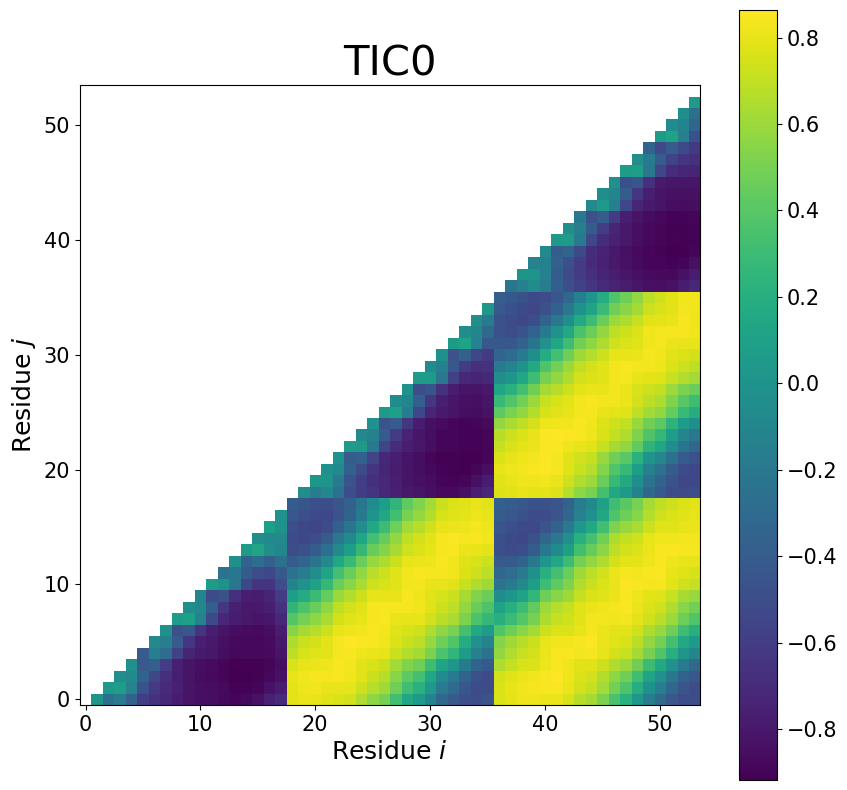

In [36]:
from tqdm import tqdm
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10,10)

matrix = np.empty((54, 54))
matrix[:] = np.nan
idxs = np.arange(54)
grid = np.array(np.meshgrid(idxs, idxs)).T.reshape(-1, 2)
pairs = grid[grid[:, 0] > grid[:, 1]]
for i in tqdm(range(len(pairs))):
    matrix[pairs[i][0], pairs[i][1]] = tica.model.feature_component_correlation[i, 0]
plt.imshow(matrix.T, origin='lower', cmap='viridis')
plt.title('TIC0', fontsize=30)
plt.xlabel('Residue $i$')
plt.ylabel('Residue $j$')
plt.colorbar()

Text(0, 0.5, 'TIC0')

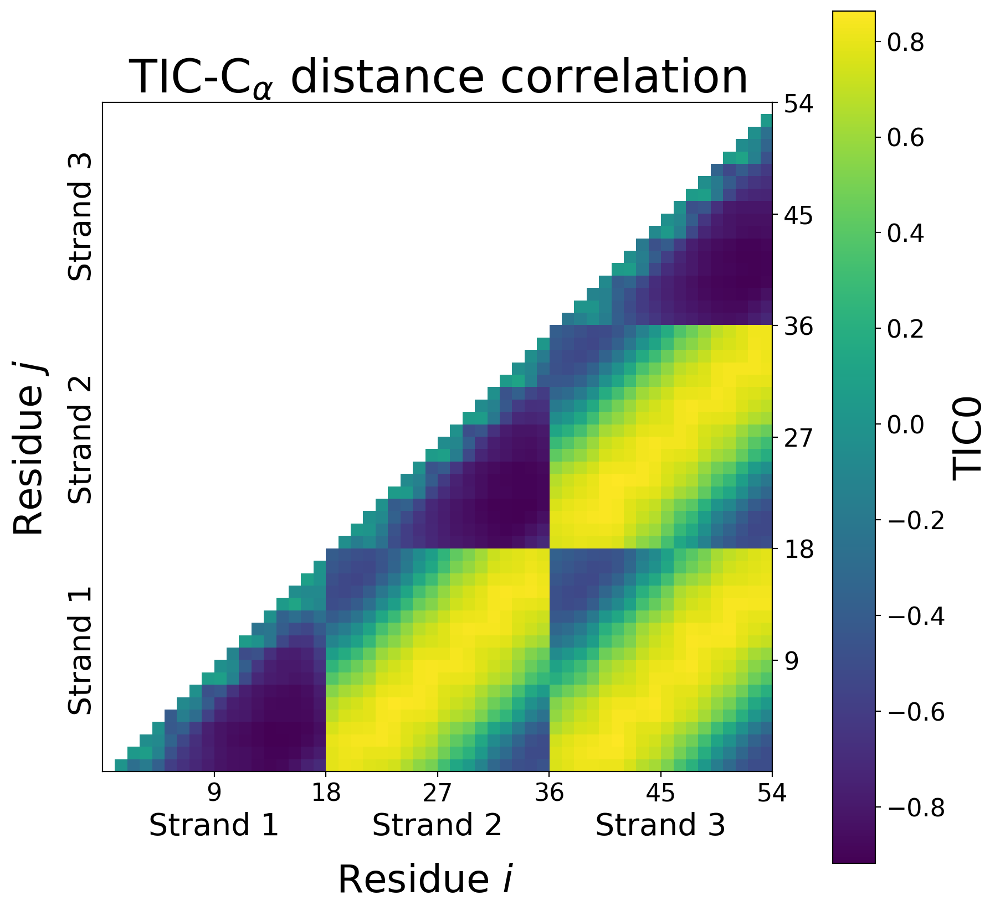

In [56]:
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10,10)
matplotlib.rc('xtick', labelsize=16) 
matplotlib.rc('ytick', labelsize=16) 
plt.figure(dpi=200)
plt.imshow(matrix.T, origin='lower', cmap='viridis', extent=[0, 54, 0, 54])
plt.title(r'TIC-C$_{\alpha}$ distance correlation', fontsize=30)

plt.xticks(np.arange(9, 63, 9))
plt.yticks(np.arange(9, 63, 9), position='left')
plt.gca().yaxis.tick_right()
# plt.ylabel('Residue $j$', fontsize=25)
sec = plt.gca().secondary_xaxis(location=0)
sec.set_xticks([9, 27, 45], labels=['\nStrand 1', '\nStrand 2', '\nStrand 3'], fontsize=20)
sec.tick_params('x', length=0)
sec.tick_params(axis='both', which='both', length=0)
sec.spines['bottom'].set_visible(False)
# lines between the classes:
sec2 = plt.gca().secondary_xaxis(location=0)
sec2.set_xticks([26], labels=['\n\nResidue $i$'], fontsize=25)
sec2.spines['bottom'].set_visible(False)
sec2.tick_params(axis='both', which='both', length=0)
sec = plt.gca().secondary_yaxis(location=0)
sec.set_yticks([13, 30, 48], labels=['\nStrand 1', '\nStrand 2', '\nStrand 3'], fontsize=20, rotation=90)
sec.tick_params('x', length=0)
sec.spines['left'].set_visible(False)
sec.tick_params(axis='both', which='both', length=0)
# lines between the classes:
sec2 = plt.gca().secondary_yaxis(location=-0.07)
sec2.set_yticks([32], labels=['Residue $j$'],fontsize=25, rotation=90)
sec2.spines['left'].set_visible(False)
sec2.tick_params(axis='both', which='both', length=0)
cbar = plt.colorbar(pad=0.07)
cbar.ax.set_ylabel('TIC0', fontsize=25)

100%|███████████████████████████████████| 1431/1431 [00:00<00:00, 128435.53it/s]


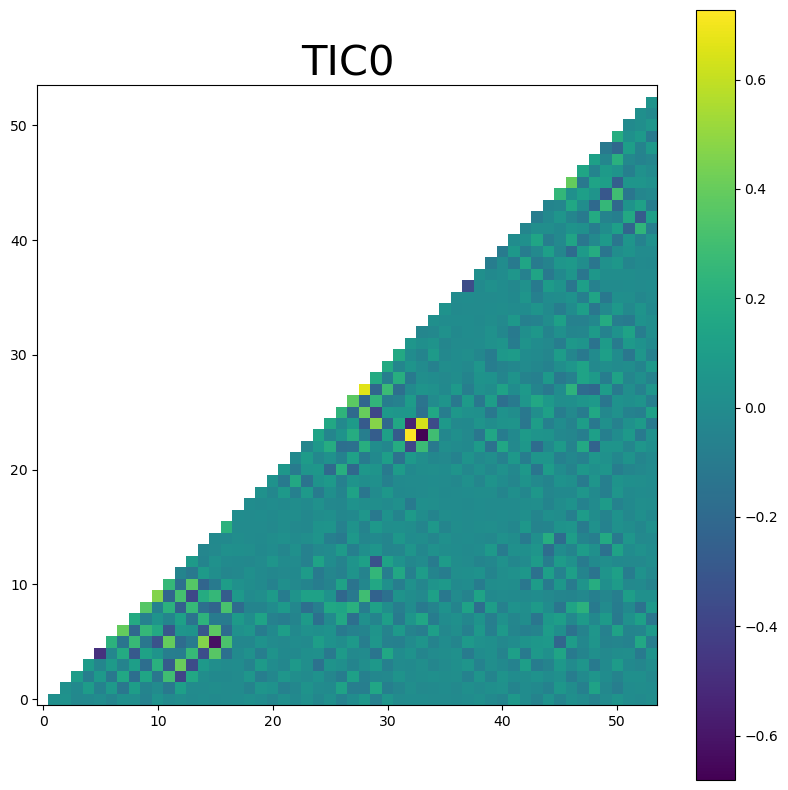

In [6]:
from tqdm import tqdm
import matplotlib
matplotlib.rcParams['figure.figsize'] = (10,10)

def sigmoid(x):
  return 1 / (1 + np.exp(-x))
matrix = np.empty((54, 54))
matrix[:] = np.nan
idxs = np.arange(54)
grid = np.array(np.meshgrid(idxs, idxs)).T.reshape(-1, 2)

pairs = grid[grid[:, 0] > grid[:, 1]]
for i in tqdm(range(len(pairs))):
    matrix[pairs[i][0], pairs[i][1]] = tica.model.singular_vectors_left[i, 0]
plt.imshow(matrix.T, origin='lower', cmap='viridis')
plt.title('TIC0', fontsize=30)
plt.colorbar()
plt.show()
# matrix = np.empty((54, 54))
# matrix[:] = np.nan
# idxs = np.arange(54)
# grid = np.array(np.meshgrid(idxs, idxs)).T.reshape(-1, 2)

# pairs = grid[grid[:, 0] > grid[:, 1]]
# for i in tqdm(range(len(pairs))):
#     matrix[pairs[i][0], pairs[i][1]] = tica.model.singular_vectors_left[i, 6]
# plt.imshow(matrix.T, origin='lower', cmap='viridis')
# plt.title('TIC0', fontsize=30)
# plt.colorbar()

In [17]:
import nglview as nv
def view_traj(traj):
    # traj = md.load(f'{s}.xtc', top=f'{s}.gro')
    # traj = slice(traj, 'not water')
    traj_ca = traj.atom_slice(traj.top.select('name CA'))
    traj_backbone = traj.atom_slice(traj.top.select('name CA or name CLP or name NL or name OL'))
    traj_nb = traj.atom_slice(traj.top.select('not (name CA or name CLP or name OL or element H) and not resname ACEp and not resname NMEp and not resid 1 and not resid 21 and not resid 41 and not resid 19 and not resid 39 and not resid 59'))
    view = nv.show_mdtraj(traj_backbone)
    view.clear()
    view.add_ribbon()
    a = view.add_trajectory(traj_nb)
    a.clear_representations()
    a.add_representation('ball+stick')
    view.add_unitcell()
    return view

last_traj = md.load('PPGPPG/4_umbrella/28/md_whole.xtc', top='PPGPPG/4_umbrella/28/md_whole.gro')
melt_traj = md.load('EKGKEG/3_anneal/md0_whole.xtc', top='EKGKEG/3_anneal/md_whole.gro')
view_traj(melt_traj)

NGLWidget(max_frame=9300)

In [29]:
melt1_traj = md.load('PPGPPG/3_anneal/md3_whole.xtc', top='PPGPPG/3_anneal/md_whole.gro')
view_traj(melt1_traj)

NGLWidget(max_frame=36118)

In [12]:
melt2_traj = md.load('PPGPPG/3_anneal/md2_whole.xtc', top='PPGPPG/3_anneal/md_whole.gro')
view_traj(melt2_traj)

NameError: name 'view_traj' is not defined

PPGPPG
HYBRID
EKGEKG
DMGCIG
EDGDDG


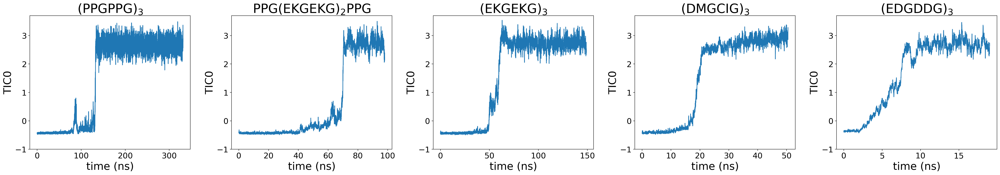

In [24]:

import matplotlib
matplotlib.rcParams['figure.figsize'] = (32,6)
matplotlib.rcParams['font.size'] = 24
matplotlib.rc('xtick', labelsize=18) 
matplotlib.rc('ytick', labelsize=18) 

fig, ax = plt.subplots(1, 5, dpi=200)
for k, folder in enumerate(['PPGPPG', 'HYBRID', 'EKGEKG', 'DMGCIG', 'EDGDDG']):
    for i in range(3, 4):
        for j in range(1):
            print(folder)
            traj = md.load(f'{folder}/3_anneal/md{i}_whole.xtc', top=f'{folder}/3_anneal/md_whole.gro')
            traj_ca = traj.atom_slice(traj.top.select('name CA'))
            # helix1 = traj.atom_slice(traj.top.select('name CA and (resid 0 to 19)'))
            # helix2 = traj.atom_slice(traj.top.select('name CA and (resid 20 to 39)'))
            # helix3 = traj.atom_slice(traj.top.select('name CA and (resid 40 to 59)'))
            # min_rg = np.min([md.compute_rg(helix1), md.compute_rg(helix2), md.compute_rg(helix3)], axis=0)
            
            
            dists = compute_all_distances(traj_ca)
            dist_tica = tica.transform(dists)
            break_index = np.where(dist_tica[:, j] > 2)[0][0]
            ax_ = ax[k]
            ax_.plot(np.arange(min(dist_tica.shape[0], int(break_index * 2.5))) / 100, dist_tica[:int(break_index * 2.5), j])
            ax_.set_xlabel('time (ns)')
            ax_.set_ylabel(f'TIC{j}')
            ax_.set_ylim(-1, 3.7)
            if folder == 'HYBRID':
                ax_.set_title(f'PPG(EKGEKG)$_2$PPG')
            else:
                ax_.set_title(f'({folder})$_3$')
plt.tight_layout(pad=1)

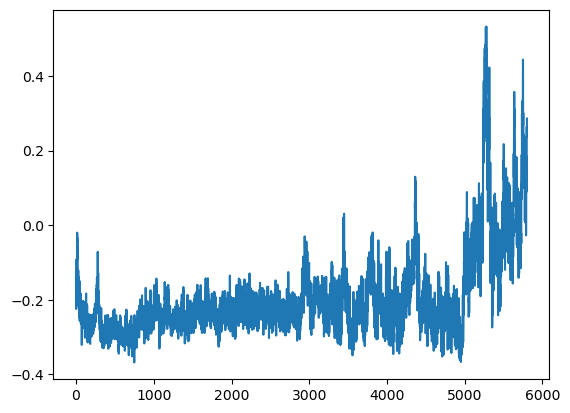

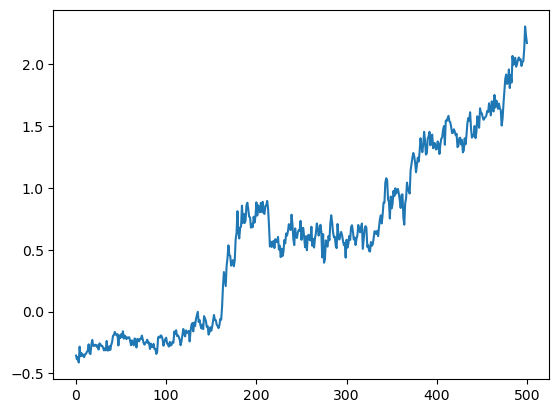

In [11]:
# traj = md.load(f'PPGPPG/3_anneal/md0_whole.xtc', top=f'PPGPPG/3_anneal/md_whole.gro')
# traj_ca = traj.atom_slice(traj.top.select('name CA'))

# dists = compute_all_distances(traj_ca)
# dist_tica = tica.transform(dists)
# plt.plot(dist_tica[:, 0])
traj = md.load(f'HYBRID/3_anneal/md0_whole.xtc', top=f'HYBRID/3_anneal/md_whole.gro')
traj_ca = traj.atom_slice(traj.top.select('name CA'))

dists = compute_all_distances(traj_ca)
dist_tica = tica.transform(dists)
plt.plot(dist_tica[:, 0])
plt.show()
traj = md.load(f'EDGDDG/3_anneal/md0_whole.xtc', top=f'EDGDDG/3_anneal/md_whole.gro')
traj_ca = traj.atom_slice(traj.top.select('name CA'))

dists = compute_all_distances(traj_ca)
dist_tica = tica.transform(dists)
plt.plot(dist_tica[:, 0])
plt.show()

0
1
2
3
4
5
6
7
8
9
10
11
12


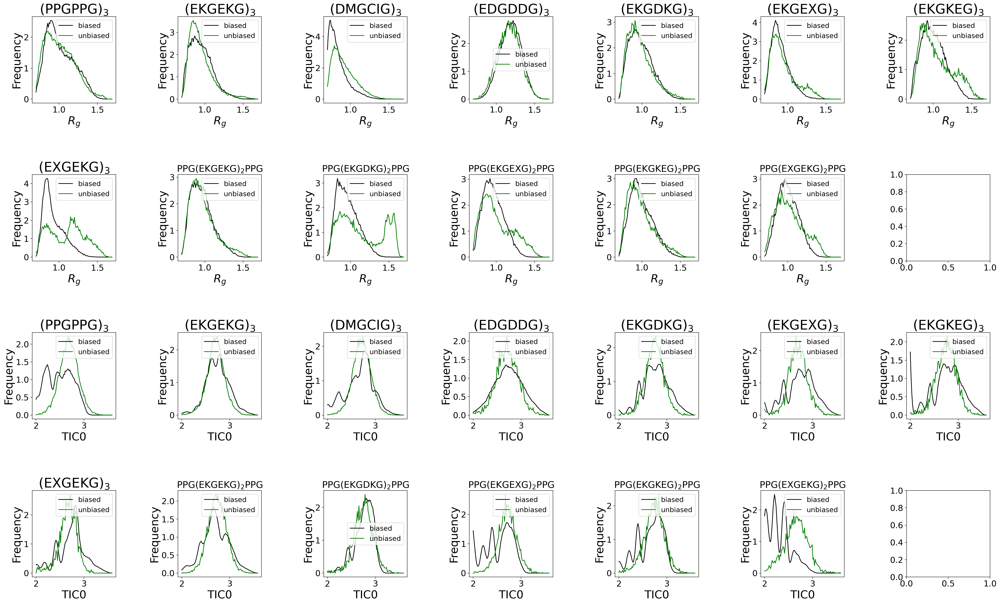

In [8]:
from tqdm import tqdm
import matplotlib
matplotlib.rcParams['font.size'] = 24
matplotlib.rc('xtick', labelsize=18) 
matplotlib.rc('ytick', labelsize=18) 
fig, ax = plt.subplots(4, 7, figsize=[32, 20], dpi=200)
def read_as_pandas(file_or_path):
    """
    Simplified version of read_as_pandas that only reads a PLUMED file into a pandas DataFrame.

    Parameters:
        file_or_path (str): Path to the PLUMED output file.

    Returns:
        pd.DataFrame: DataFrame containing the data from the PLUMED file.
    """
    # Open the file, skipping any header lines :dstarting with "#"
    with open(file_or_path, 'r') as file:
        lines = [line for i, line in enumerate(file) if ('!' not in line or i == 0)]

    
    lines[0] = lines[0].replace('#! FIELDS ', '')
    # Convert the filtered lines into a pandas DataFrame
    from io import StringIO
    
    data = StringIO("\n".join(lines))
    df = pd.read_csv(data, sep='\s+')

    return df
    
import mdtraj as md
import pickle
n_bins = 100

init_idx = 2
hist_range = np.arange(init_idx, 3.6, 0.1)
def compute_all_distances(traj):
    idxs = np.arange(traj.top.n_atoms)
    grid = np.array(np.meshgrid(idxs, idxs)).T.reshape(-1, 2)
    pairs = grid[grid[:, 0] > grid[:, 1]]
    dists = md.compute_distances(traj, pairs)
    return dists

titles = ['(PPGPPG)$_3$', '(EKGEKG)$_3$', '(DMGCIG)$_3$', '(EDGDDG)$_3$', '(EKGDKG)$_3$', '(EKGEXG)$_3$', '(EKGKEG)$_3$', '(EXGEKG)$_3$', 'PPG(EKGEKG)$_2$PPG', 'PPG(EKGDKG)$_2$PPG', 'PPG(EKGEXG)$_2$PPG', 'PPG(EKGKEG)$_2$PPG', 'PPG(EXGEKG)$_2$PPG']
for n, folder in enumerate(['PPGPPG', 'EKGEKG', 'DMGCIG', 'EDGDDG', 'EKGDKG', 'EKGEXG', 'EKGKEG', 'EXGEKG', 'HYBRID', 'HYBRI2', 'HYBRI3', 'HYBRI4', 'HYBRI5']):
    print(n)
    total_hist = np.zeros(n_bins)
    total_hist2 = np.zeros(n_bins)
    ax1 = ax[n // 7, n % 7]
    ax2 = ax[n // 7 + 2, n % 7]
    wham_file = np.loadtxt(f'{folder}/4_umbrella/free.txt')
    x = wham_file[:, 0]
    probs = wham_file[:, 3]
    x_ = x[np.logical_and(x > (init_idx - .05), ~np.isnan(probs))]
    probs_ = probs[np.logical_and(x > (init_idx - .05), ~np.isnan(probs))]
    total_prob = np.sum(probs_)
    if n == 4:
        hist_range = np.arange(init_idx + 0.05, 3.5, 0.1)
    if n == 8:
        hist_range = np.arange(init_idx, 3.6, 0.1)
    if n == 9:
        hist_range = np.arange(init_idx + 0.05, 3.5, 0.1)
    for i in hist_range:
        stri = f'{np.round(i, 1)}'.replace('.', '').replace('-', 'n')
        traj = md.load(f'{folder}/4_umbrella/{stri}/md_whole.xtc', top=f'{folder}/4_umbrella/{stri}/md_whole.gro')
        helix1 = traj.atom_slice(traj.top.select('resid 0 to 19'))
        helix2 = traj.atom_slice(traj.top.select('resid 20 to 39'))
        helix3 = traj.atom_slice(traj.top.select('resid 40 to 59'))
        hist = np.zeros(n_bins)
        for hx in [helix1, helix2, helix3]:
            cur_hist, bins = np.histogram(md.compute_rg(hx), np.linspace(0.7, 1.7, n_bins + 1), density=True)
            hist += cur_hist / 3
        total_hist += hist * probs_[np.isclose(x_, i)] / total_prob

        colvar = read_as_pandas(f'{folder}/4_umbrella/{stri}/COLVAR_{stri}.{stri[-1]}')
        
        hist, bins2 = np.histogram(colvar['tic.node-0'], np.linspace(init_idx, 3.6, n_bins + 1), density=True)
    
        total_hist2 += hist * probs_[np.isclose(x_, i)] / total_prob
        # plt.plot(bins[:-1], hist/10,  c=[(i - init_idx) * 10/len(hist_range), 0, (len(hist_range) - (i - init_idx) * 10)/len(hist_range)], label=f'biased TIC0={"%.1f" % i}')
    ax1.plot(bins[:-1], total_hist,  c='black', label=f'biased')
    ax2.plot(bins2[:-1], total_hist2,  c='black', label=f'biased')
    traj = md.load(f'{folder}/3_anneal/md0_whole.xtc', top=f'{folder}/3_anneal/md_whole.gro')
    
    melt_time = np.loadtxt(f'{folder}/3_anneal/0_annealing_output.txt')[-1, 0]
    traj = traj[traj.time > melt_time]
    traj_ca = traj.atom_slice(traj.top.select('name CA'))
    ca_dists = compute_all_distances(traj_ca)
    
    cvs = tica.transform(ca_dists)[:, 0]
    
    helix1 = traj.atom_slice(traj.top.select('resid 0 to 19'))
    helix2 = traj.atom_slice(traj.top.select('resid 20 to 39'))
    helix3 = traj.atom_slice(traj.top.select('resid 40 to 59'))
    hist = np.zeros(n_bins)
    for hx in [helix1, helix2, helix3]:
        cur_hist, bins = np.histogram(md.compute_rg(hx), np.linspace(0.7, 1.7, n_bins + 1), density=True)
        hist += cur_hist / 3
    
    ax1.plot(bins[:-1], hist, c='green', label=f'unbiased')
    ax1.legend(fontsize=15)
    if n < 8:
        ax1.set_title(titles[n])
    else:
        ax1.set_title(titles[n], fontsize=20)
    ax1.set_ylabel('Frequency')
    ax1.set_xlabel('$R_g$')
    
    hist, bins = np.histogram(cvs, np.linspace(init_idx, 3.6, 101), density=True)
    
    ax2.plot(bins[:-1], hist, c='green', label=f'unbiased')
    ax2.legend(fontsize=15)
    if n < 8:
        ax2.set_title(titles[n])
    else:
        ax2.set_title(titles[n], fontsize=20)
    # if folder == 'HYBRID':
    #     ax2.set_title('PPG(EKGEKG)$_2$PPG')
    # else:
    #     ax2.set_title(f'({folder})$_3$')
    ax2.set_ylabel('Frequency')
    ax2.set_xlabel('TIC0')

plt.tight_layout(pad=3)
plt.savefig('TIC_validation_distributions.png')
plt.show()


In [ ]:
fig, ax = plt.subplots(4, 7, figsize=[32, 20], dpi=200)

for n, folder in enumerate(['EKGDKG', 'EKGEXG', 'EKGKEG', 'EXGEKG', 'HYBRID', 'HYBRI2', 'HYBRI3', 'HYBRI4', 'HYBRI5']):
    print(n)
    total_hist = np.zeros(n_bins)
    total_hist2 = np.zeros(n_bins)
    ax1 = ax[n // 7, n % 7]
    ax2 = ax[n // 7 + 2, n % 7]
    wham_file = np.loadtxt(f'{folder}/4_umbrella/free.txt')
    x = wham_file[:, 0]
    probs = wham_file[:, 3]
    x_ = x[np.logical_and(x > (init_idx - .05), ~np.isnan(probs))]
    probs_ = probs[np.logical_and(x > (init_idx - .05), ~np.isnan(probs))]
    total_prob = np.sum(probs_)
    if n == 4:
        hist_range = np.arange(init_idx + 0.05, 3.5, 0.1)
    if n == 8:
        hist_range = np.arange(init_idx, 3.6, 0.1)
    if n == 9:
        hist_range = np.arange(init_idx + 0.05, 3.5, 0.1)
    for i in hist_range:
        stri = f'{np.round(i, 1)}'.replace('.', '').replace('-', 'n')
        traj = md.load(f'{folder}/4_umbrella/{stri}/md_whole.xtc', top=f'{folder}/4_umbrella/{stri}/md_whole.gro')
        helix1 = traj.atom_slice(traj.top.select('resid 0 to 19'))
        helix2 = traj.atom_slice(traj.top.select('resid 20 to 39'))
        helix3 = traj.atom_slice(traj.top.select('resid 40 to 59'))
        hist = np.zeros(n_bins)
        for hx in [helix1, helix2, helix3]:
            cur_hist, bins = np.histogram(md.compute_rg(hx), np.linspace(0.7, 1.7, n_bins + 1), density=True)
            hist += cur_hist / 3
        total_hist += hist * probs_[np.isclose(x_, i)] / total_prob

        colvar = read_as_pandas(f'{folder}/4_umbrella/{stri}/COLVAR_{stri}.{stri[-1]}')
        
        hist, bins2 = np.histogram(colvar['tic.node-0'], np.linspace(init_idx, 3.6, n_bins + 1), density=True)
    
        total_hist2 += hist * probs_[np.isclose(x_, i)] / total_prob
        # plt.plot(bins[:-1], hist/10,  c=[(i - init_idx) * 10/len(hist_range), 0, (len(hist_range) - (i - init_idx) * 10)/len(hist_range)], label=f'biased TIC0={"%.1f" % i}')
    ax1.plot(bins[:-1], total_hist,  c='black', label=f'biased')
    ax2.plot(bins2[:-1], total_hist2,  c='black', label=f'biased')
    traj = md.load(f'{folder}/3_anneal/md0_whole.xtc', top=f'{folder}/3_anneal/md_whole.gro')
    
    melt_time = np.loadtxt(f'{folder}/3_anneal/0_annealing_output.txt')[-1, 0]
    print(traj)

    traj = traj[traj.time > melt_time]
    traj_ca = traj.atom_slice(traj.top.select('name CA'))
    ca_dists = compute_all_distances(traj_ca)
    
    cvs = tica.transform(ca_dists)[:, 0]
    
    helix1 = traj.atom_slice(traj.top.select('resid 0 to 19'))
    helix2 = traj.atom_slice(traj.top.select('resid 20 to 39'))
    helix3 = traj.atom_slice(traj.top.select('resid 40 to 59'))
    print(traj)
    hist = np.zeros(n_bins)
    for hx in [helix1, helix2, helix3]:
        cur_hist, bins = np.histogram(md.compute_rg(hx), np.linspace(0.7, 1.7, n_bins + 1), density=True)
        hist += cur_hist / 3
    
    ax1.plot(bins[:-1], hist, c='green', label=f'unbiased')
    ax1.legend(fontsize=15)
    ax1.set_title(titles[n])
    ax1.set_ylabel('Frequency')
    ax1.set_xlabel('$R_g$')
    print(hist)
    hist, bins = np.histogram(cvs, np.linspace(init_idx, 3.6, 101), density=True)
    
    ax2.plot(bins[:-1], hist, c='green', label=f'unbiased')
    ax2.legend(fontsize=15)
    if folder == 'HYBRID':
        ax2.set_title('PPG(EKGEKG)$_2$PPG')
    else:
        ax2.set_title(f'({folder})$_3$')
    ax2.set_ylabel('Frequency')
    ax2.set_xlabel('TIC0')

plt.tight_layout(pad=2)
plt.savefig('TIC_validation_distributions.png')
plt.show()


In [44]:
from pymol import cmd
import pymol
def load_trajectory(topology):
    """
    Load a molecular dynamics trajectory into PyMOL.
    
    :param topology: Path to the topology file (e.g., PDB, GRO)
    :param trajectory: Path to the trajectory file (e.g., XTC, DCD)
    """
    # pymol.finish_launching()
    cmd.load(topology, "structure")
    # cmd.load_traj(trajectory, "structure", state=1, interval=1)
    view = cmd.show("sticks")
    pymol.cmd.set("ray_trace_frames", 1)  # Enable ray tracing
    pymol.cmd.set("ray_shadows", 1)  # Enable shadows for better depth
    pymol.cmd.set("antialias", 2)  # Apply anti-aliasing
    pymol.cmd.set("ray_trace_mode", 1)  # Enhance shading
    
    # Generate high-resolution ray-traced image (4K example: 3840x2160)
    pymol.cmd.ray(3840, 2160)
    pymol.cmd.png("output.png", dpi=300)  # Save with high DPI
    return view 
# Example usage
# Replace with your actual file paths
topology_file = "EKGEKG/3_anneal/md_whole.pdb"
trajectory_file = "EKGEKG/3_anneal/md1_whole.xtc"
view = load_trajectory(topology_file)


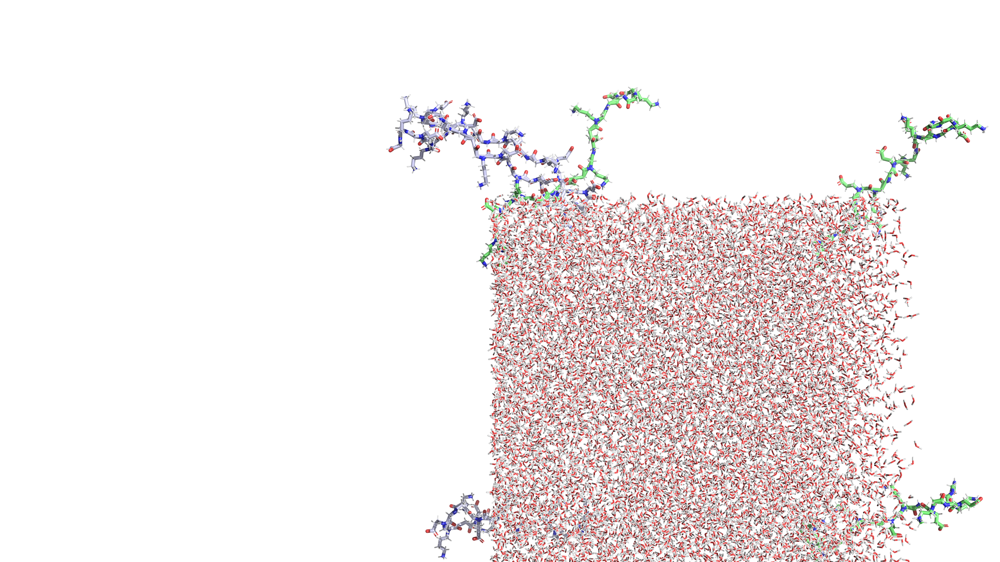

In [45]:
from IPython.display import Image
Image("output.png")


 Ray: render time: 0.23 sec. = 15490.6 frames/hour (46.39 sec. accum.).


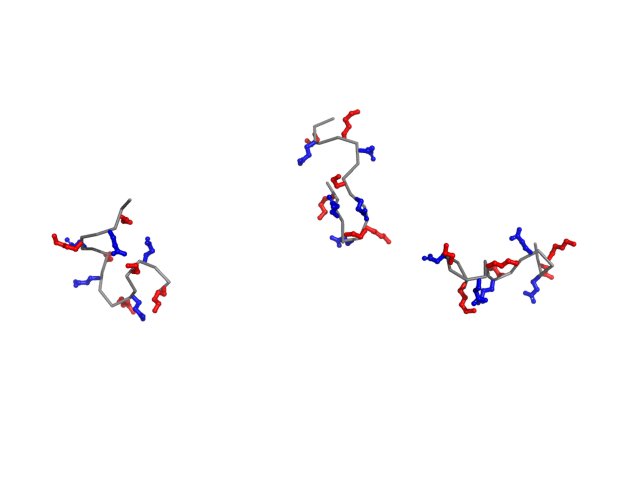

In [35]:
import pymol.cmd as cmd
import psutil
import tempfile 


def load_and_visualize_trajectory(name):
    # Load trajectory and topology
    # xtc_file = f"{name}.xtc"
    gro_file = f"{name}.gro"
    cmd.reinitialize()
    cmd.load(gro_file, "structure")
    # cmd.load_traj(xtc_file, "protein", state=1)
    # Hide default representation
    cmd.hide("everything", "structure")

    # Show ribbon representation for backbone
    cmd.select("bb_atoms", "name CA or name CLP or name NL or name OL")
    cmd.show("ribbon", "bb_atoms")
    cmd.color( "gray", "bb_atoms")
    cmd.orient("bb_atoms")
    # Select non-backbone atoms for ball-and-stick representation
    cmd.select("non_backbone", "not (name CA or name CLP or name OL element H) and "
               "not resname ACEp and not resname NMEp and "
               "not resid 1 and not resid 21 and not resid 41 and "
               "not resid 19 and not resid 39 and not resid 59")
    cmd.select("plus_chg", "resname LYSp or resname ARGp or resname NAEk")
    cmd.select("minus_chg", "resname GLUd or resname ASPd")
    cmd.show("sticks", "non_backbone")
    cmd.color("red", "non_backbone and plus_chg")
    cmd.color("blue", "non_backbone and minus_chg")
    cmd.color("green", "non_backbone and not (plus_chg or minus_chg)")
    cmd.show("sphere", "non_backbone and not name NL and resid 1-59")
    # Display unit cell if available
    cmd.set("cartoon_fancy_helices", 1)
    cmd.set("antialias", 2)  # Apply anti-aliasing
    cmd.set("stick_radius", 0.4)
    cmd.set("ribbon_transparency", 0)
    cmd.set("sphere_scale", 0.3)
    cmd.ray(1920, 1080)
    cmd.zoom("all")
    cmd.png("output2.png", dpi=300) 
    from IPython.display import Image
    return Image("output2.png")

def snapshot(folder, val):
    traj = md.load(f'{folder}/4_umbrella/{val}/umbrella.gro')
    traj = traj.atom_slice(traj.top.select('not water and not name NA and not name CL'))
    # traj_ca = traj.atom_slice(traj.top.select('name CA'))
    # traj_backbone = traj.atom_slice(traj.top.select('name CA or name CLP or name NL or name OL'))
    # traj_nb = traj.atom_slice(traj.top.select('not (name CA or name CLP or name OL or element H) and not resname ACEp and not resname NMEp and not resid 1 and not resid 21 and not resid 41 and not resid 19 and not resid 39 and not resid 59'))
    # ca_dists = compute_all_distances(traj_ca)
    # cvs = tica.transform(ca_dists)[:, 0]
    # frame = np.argmin(np.abs(cvs - val))
    with tempfile.TemporaryDirectory() as tempdir:
        traj[0].save_gro(f'{tempdir}/temp.gro')
        return load_and_visualize_trajectory(f'{tempdir}/temp')

snapshot('EKGEXG', '24')
# Example usage
# load_and_visualize_trajectory("KIGENG/2_em/nvt")


In [28]:
import nglview as nv
nv.show_file("EXGEKG/4_umbrella/n08/umbrella.gro")

NGLWidget()